## Description:
Decomposes Sd into the 3 terms: Source term, Conduction term, (Species) Diffusion term. Looks at the pairwise plot between the three terms and between each term and Sd.

In [1]:
from __future__ import annotations
from pathlib import Path
import os
os.chdir("../../..")
import yaml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from FLAME.io_fronts import Case, load_fronts

### Read config file and define helper functions

In [2]:
PROJECT_ROOT = Path.cwd().resolve()
CONFIG_PATH = PROJECT_ROOT / "notebooks" / "case_studies/FDS_decomposition_analysis" / "FDS_decomposition_analysis.yaml"
CFG = yaml.safe_load(CONFIG_PATH.read_text(encoding="utf-8"))

DATA_BASE_DIR = PROJECT_ROOT / Path(CFG["BASE_DIR"])
PHI = float(CFG["PHI"])
LAT_SIZE = str(CFG["LAT_SIZE"])
TIME_STEPS = list(CFG["TIME_STEPS"])

PROGRESS_LEVELS = list(CFG["PROGRESS_LEVELS"])
POST = bool(CFG["POST"])
MULTIPLE_RUNS = bool(CFG["MULTIPLE_RUNS"])
N_RUN = int(CFG["N_RUN"])

# Features and target
TERMS = list(CFG["TERMS"])
TARGET = str(CFG["TARGET"])

# Curvature coloring
CURVATURE_COLUMN = str(CFG["CURVATURE_COLUMN"])

# Sd filter (set min/max to enable; use None for no bound)
SD_COLUMN = str(CFG["SD_COLUMN"])
SD_MIN = CFG["SD_MIN"]
SD_MAX = CFG["SD_MAX"]

# Plot controls
FIG_DPI = 250
SCATTER_S = float(CFG["SCATTER_S"])
ALPHA = float(CFG["ALPHA"])
RASTERIZE = bool(CFG["RASTERIZE"])

# Color cross-plots by DW_FDS (recommended)
COLOR_CROSS_BY_TARGET = bool(CFG["COLOR_CROSS_BY_TARGET"])

# Minimum samples to plot
MIN_SAMPLES = int(CFG["MIN_SAMPLES"])

# Save figures
SAVE_FIGS = bool(CFG["SAVE_FIGS"])
REPORT_BASE_DIR = PROJECT_ROOT / Path(CFG["OUT_BASE_DIR"])

PHI_TAG = f"phi_{PHI:g}"
LAT_TAG = f"h400x{LAT_SIZE}_ref"


def time_dir(time_step: int) -> Path:
    return REPORT_BASE_DIR / PHI_TAG / LAT_TAG / f"t_{time_step}"


def case_out_dir(time_step: int, c_val: float | None = None, *parts: str) -> Path:
    out = time_dir(time_step)
    if c_val is not None and len(PROGRESS_LEVELS) > 1:
        out = out / f"T_{float(c_val):g}"
    for part in parts:
        out = out / part
    return out

ISO_SCATTER_DIR = "isocontour_scatter"

# Output/run directory and file naming
RUN_DIR = REPORT_BASE_DIR
CROSS_FNAME_FMT = "cross__{f1}__vs__{f2}"
DWVS_FNAME_FMT = f"dw_vs__{TARGET}__vs__{{feat}}"

# ============================================================
# PLOT STYLE (template-based)
# ============================================================
import matplotlib.pyplot as plt

PLOT_FONT_FAMILY = str(CFG.get("PLOT_FONT_FAMILY", "Courier New"))
PLOT_FONT_SIZE = int(CFG.get("PLOT_FONT_SIZE", 20))
FIG_DPI = int(CFG.get("FIG_DPI", 250))
FIG_SIZE_RAW = CFG.get("FIG_SIZE", (6.8, 6.2))
if isinstance(FIG_SIZE_RAW, (list, tuple)) and len(FIG_SIZE_RAW) == 2:
    FIG_SIZE = (float(FIG_SIZE_RAW[0]), float(FIG_SIZE_RAW[1]))
else:
    FIG_SIZE = (6.8, 6.2)

PLOT_USE_TEX = bool(CFG.get("PLOT_USE_TEX", False))
PLOT_TEX_PREAMBLE_RAW = CFG.get("PLOT_TEX_PREAMBLE", "")
if isinstance(PLOT_TEX_PREAMBLE_RAW, (list, tuple)):
    PLOT_TEX_PREAMBLE = "\n".join(str(item) for item in PLOT_TEX_PREAMBLE_RAW if item)
else:
    PLOT_TEX_PREAMBLE = str(PLOT_TEX_PREAMBLE_RAW) if PLOT_TEX_PREAMBLE_RAW is not None else ""

def apply_plot_style() -> None:
    params = {
        "font.family": PLOT_FONT_FAMILY,
        "font.size": PLOT_FONT_SIZE,
        "axes.titlesize": PLOT_FONT_SIZE,
        "axes.labelsize": PLOT_FONT_SIZE,
        "xtick.labelsize": PLOT_FONT_SIZE,
        "ytick.labelsize": PLOT_FONT_SIZE,
        "legend.fontsize": PLOT_FONT_SIZE,
        "figure.titlesize": PLOT_FONT_SIZE,
        "axes.linewidth": 1.2,
        "text.usetex": PLOT_USE_TEX,
    }
    if PLOT_TEX_PREAMBLE:
        params["text.latex.preamble"] = PLOT_TEX_PREAMBLE
    plt.rcParams.update(params)

apply_plot_style()

COLOR_DATA = str(CFG.get("COLOR_DATA", "#77b5b6"))
COLOR_DATA_EDGE = str(CFG.get("COLOR_DATA_EDGE", "#378d94"))
COLOR_PRED = str(CFG.get("COLOR_PRED", "#9671bd"))
COLOR_PRED_EDGE = str(CFG.get("COLOR_PRED_EDGE", "#6a408d"))
COLOR_NEUTRAL = str(CFG.get("COLOR_NEUTRAL", "#7e7e7e"))
COLOR_LINE = str(CFG.get("COLOR_LINE", "#8a8a8a"))

LABEL_CURV = r"$\kappa^*$"
LABEL_STRETCH = r"$\mathbb{K}^*$"
LABEL_SD = r"$\tilde{S}_d^*$"




ISO_FIG_SIZE = (10.8, 3.6)
SCATTER_S_ISO = 10
ALPHA_ISO = 0.6
def style_axes(ax) -> None:
    ax.set_axisbelow(True)
    ax.minorticks_on()
    ax.grid(True, which="major", linestyle="-", linewidth=0.75, alpha=0.25)
    ax.grid(True, which="minor", linestyle="-", linewidth=0.25, alpha=0.15)
    ax.tick_params(axis="both", which="both", direction="in", top=True, right=True)
    ax.tick_params(axis="both", which="major", length=6, width=1.0)
    ax.tick_params(axis="both", which="minor", length=3, width=0.8)
    for spine in ax.spines.values():
        spine.set_linewidth(1.2)

def plot_isocontour_scatter(df: pd.DataFrame, savepath: Path | None = None) -> None:
    fig, ax = plt.subplots(figsize=ISO_FIG_SIZE, dpi=FIG_DPI, constrained_layout=True)
    ax.scatter(
        df["y"],
        df["x"],
        s=SCATTER_S_ISO,
        alpha=ALPHA_ISO,
        color=COLOR_DATA,
        edgecolors=COLOR_DATA_EDGE,
        linewidths=0.6,
        zorder=3,
        rasterized=RASTERIZE,
    )
    ax.set_xlabel("y")
    ax.set_ylabel("x")
    style_axes(ax)
    if savepath is not None:
        savepath.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(savepath.with_suffix(".png"), dpi=FIG_DPI, bbox_inches="tight")
        fig.savefig(savepath.with_suffix(".pdf"), bbox_inches="tight")
        fig.savefig(savepath.with_suffix(".svg"), bbox_inches="tight")
    plt.show()
    plt.close(fig)

LABEL_MAP = {
    "DW_FDS": LABEL_SD,
    "FDS_source_term": "Source Term",
    "FDS_conduction_term": "Conduction Term",
    "FDS_diffusion_term": "Species Diffusion Term",
}

def format_label(name: str) -> str:
    if name in LABEL_MAP:
        return LABEL_MAP[name]
    return name.replace("_", " ")

# ============================================================
# HELPERS
# ============================================================
def make_case(time_step: int) -> Case:
    base_kwargs = dict(
        base_dir=DATA_BASE_DIR,
        phi=PHI,
        lat_size=LAT_SIZE,
        time_step=time_step,
        post=POST,
    )
    try:
        return Case(
            **base_kwargs,
            multiple_runs=MULTIPLE_RUNS,
            n_run=N_RUN
        )
    except TypeError:
        return Case(**base_kwargs)

def make_out_dir(time_step: int, c_val: float) -> Path:
    return case_out_dir(time_step, c_val)

def require_columns(df: pd.DataFrame, cols: list[str], context: str = "") -> None:
    missing = [c for c in cols if c not in df.columns]
    if missing:
        raise ValueError(f"{context} Missing columns: {missing}")

def clean_valid_rows(df: pd.DataFrame, cols_needed: list[str]) -> pd.DataFrame:
    valid = df[cols_needed].replace([np.inf, -np.inf], np.nan).dropna(axis=0, how="any")
    return df.loc[valid.index].copy()

def _is_finite_limit(value: float | None) -> bool:
    return value is not None and np.isfinite(value)

def sd_limits_active(sd_min: float | None, sd_max: float | None) -> bool:
    return _is_finite_limit(sd_min) or _is_finite_limit(sd_max)

def _finite_or_none(value: float | None) -> float | None:
    return value if _is_finite_limit(value) else None

def apply_sd_filter(df: pd.DataFrame, sd_col: str,
                    sd_min: float | None, sd_max: float | None) -> pd.DataFrame:
    if not sd_limits_active(sd_min, sd_max):
        return df
    if sd_col not in df.columns:
        raise ValueError(f"Sd filter requires column '{sd_col}'")
    mask = np.ones(len(df), dtype=bool)
    if _is_finite_limit(sd_min):
        mask &= df[sd_col] >= sd_min
    if _is_finite_limit(sd_max):
        mask &= df[sd_col] <= sd_max
    return df.loc[mask].copy()

def apply_sd_axis_limits(ax, x_col: str, y_col: str, sd_col: str,
                         sd_min: float | None, sd_max: float | None) -> None:
    if not sd_limits_active(sd_min, sd_max):
        return
    if x_col == sd_col:
        ax.set_xlim(left=_finite_or_none(sd_min), right=_finite_or_none(sd_max))
    if y_col == sd_col:
        ax.set_ylim(bottom=_finite_or_none(sd_min), top=_finite_or_none(sd_max))

def save_or_show(fig, savepath: Path | None):
    if savepath is not None:
        savepath.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(savepath.with_suffix(".png"), dpi=FIG_DPI)
        fig.savefig(savepath.with_suffix(".pdf"))
        fig.savefig(savepath.with_suffix(".svg"))
    plt.show()
    plt.close(fig)

def plot_cross_scatter(df: pd.DataFrame, f1: str, f2: str, title: str,
                       savepath: Path | None = None, color_by: str | None = None) -> None:
    fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=True)

    if color_by is None:
        ax.scatter(df[f1], df[f2], s=SCATTER_S, alpha=ALPHA, color=COLOR_DATA, edgecolors=COLOR_DATA_EDGE, linewidths=0.6, rasterized=RASTERIZE)
    else:
        sc = ax.scatter(df[f1], df[f2], c=df[color_by], s=SCATTER_S, alpha=ALPHA,
                        edgecolors=COLOR_DATA_EDGE, linewidths=0.6, rasterized=RASTERIZE)
        cbar = fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.03)
        cbar.set_label(format_label(color_by))

    ax.set_xlabel(format_label(f1))
    ax.set_ylabel(format_label(f2))
    style_axes(ax)
    apply_sd_axis_limits(ax, f1, f2, SD_COLUMN, SD_MIN, SD_MAX)

    save_or_show(fig, savepath)

def plot_target_vs_feature(df: pd.DataFrame, feat: str, title: str,
                           savepath: Path | None = None, color_by: str | None = None) -> None:
    fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=True)

    if color_by is None:
        ax.scatter(df[feat], df[TARGET], s=SCATTER_S, alpha=ALPHA, color=COLOR_DATA, edgecolors=COLOR_DATA_EDGE, linewidths=0.6, rasterized=RASTERIZE)
    else:
        sc = ax.scatter(df[feat], df[TARGET], c=df[color_by], s=SCATTER_S, alpha=ALPHA,
                        edgecolors=COLOR_DATA_EDGE, linewidths=0.6, rasterized=RASTERIZE, cmap="viridis")
        cbar = fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.03)
        cbar.set_label(format_label(color_by))

    ax.set_xlabel(format_label(feat))
    ax.set_ylabel(format_label(TARGET))
    style_axes(ax)
    apply_sd_axis_limits(ax, feat, TARGET, SD_COLUMN, SD_MIN, SD_MAX)

    save_or_show(fig, savepath)










### Run

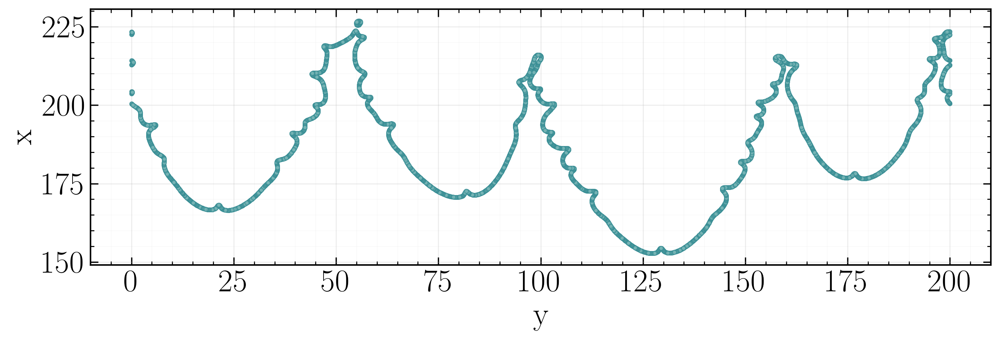

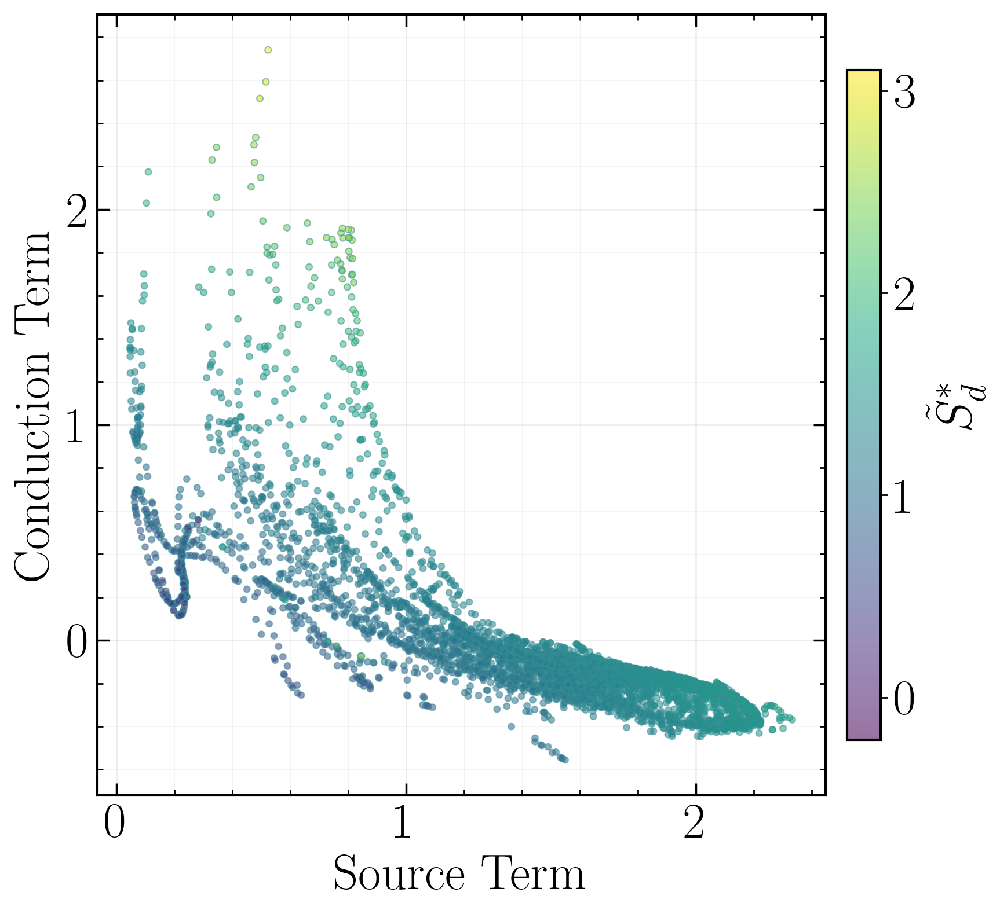

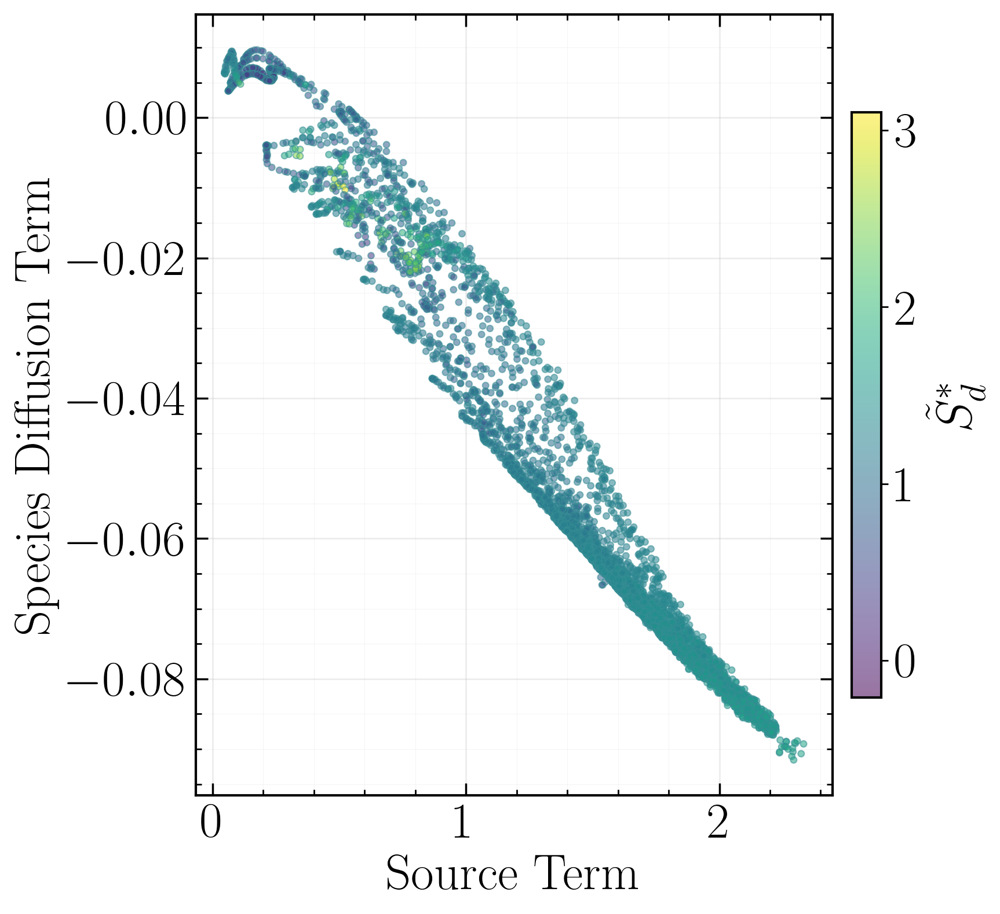

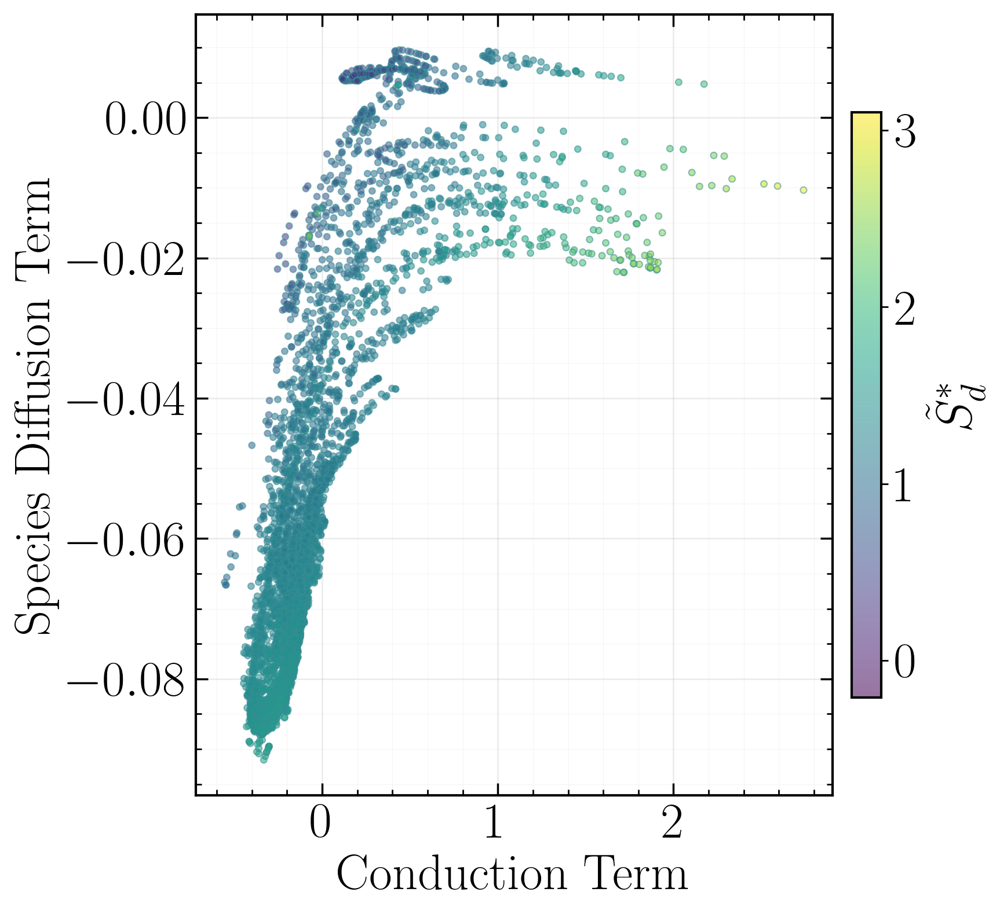

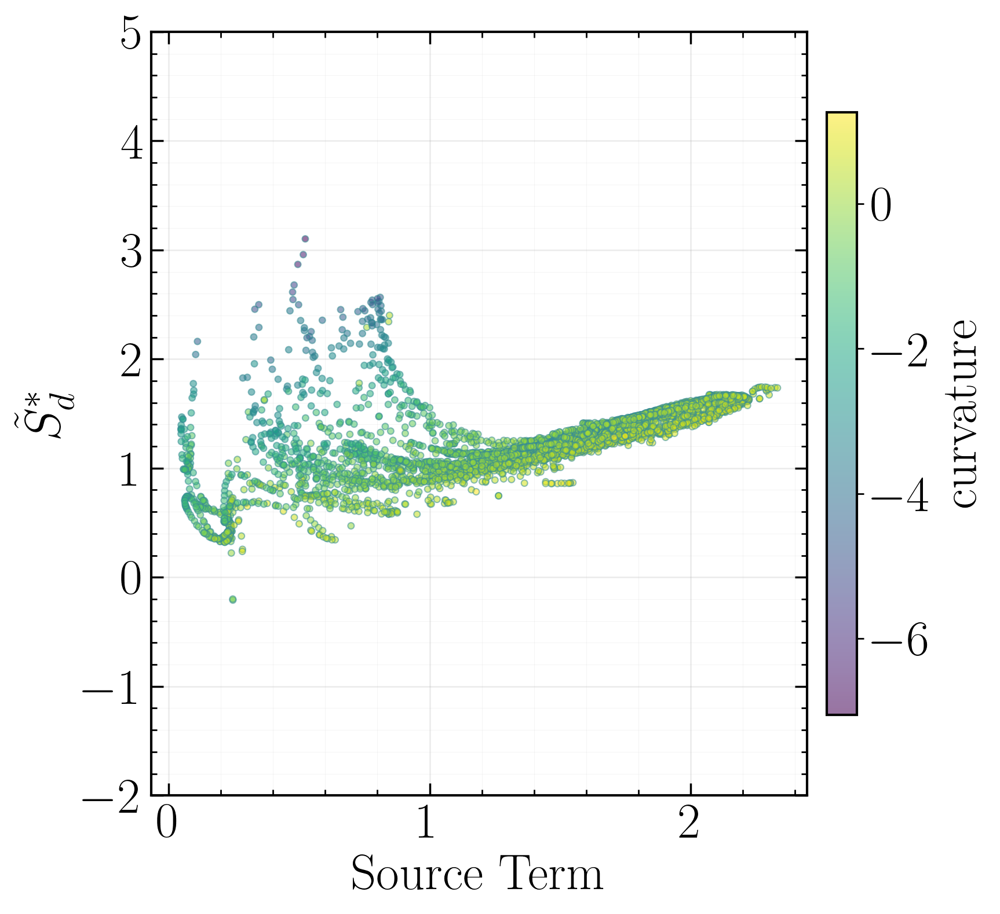

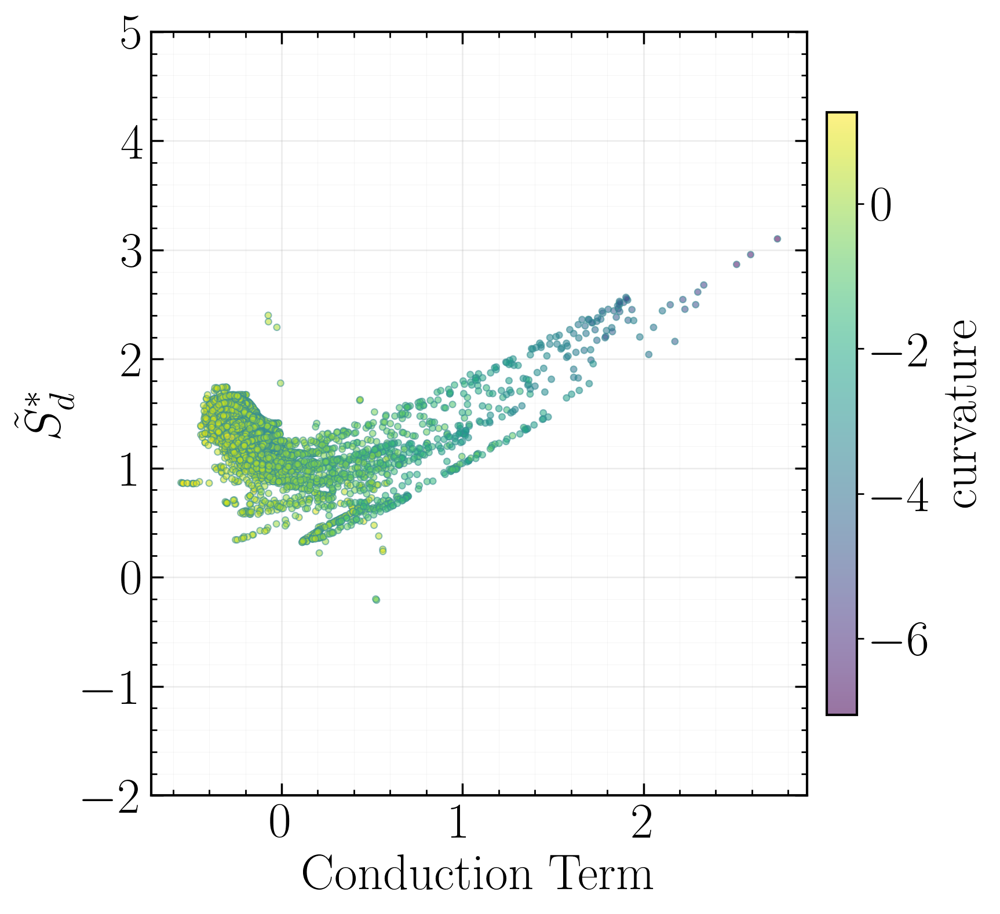

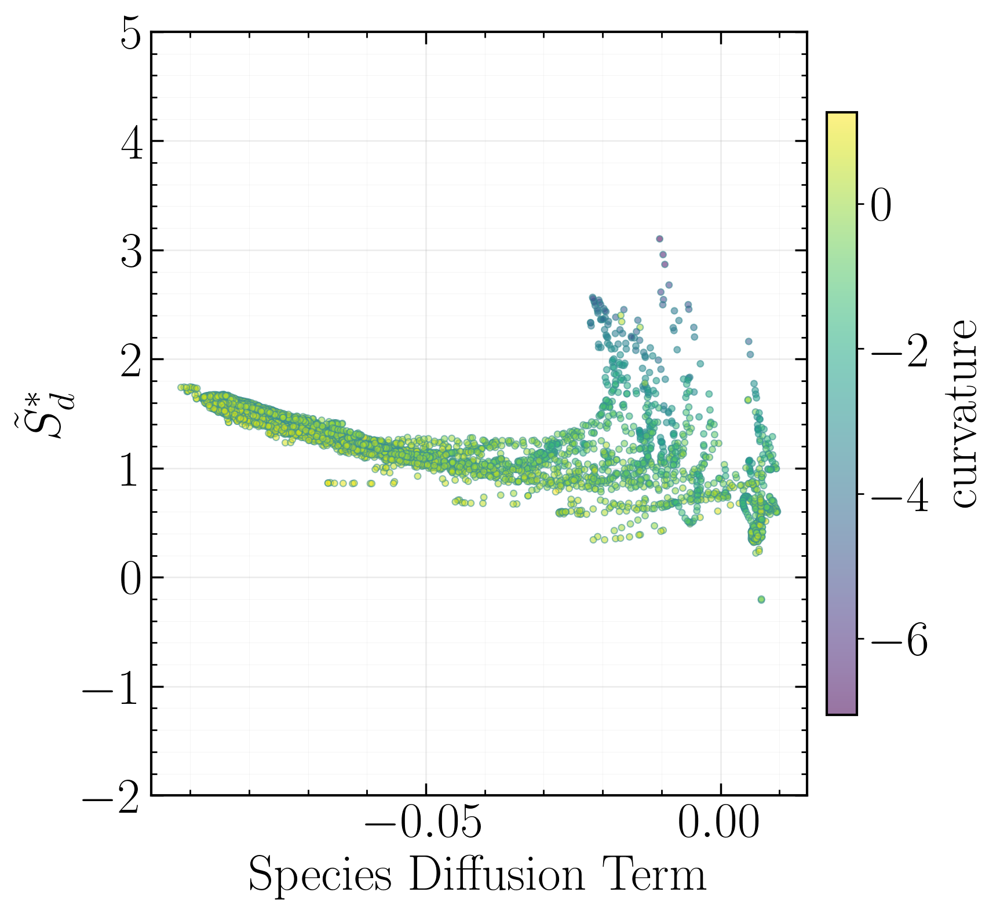

In [3]:
pairs = [
    (TERMS[0], TERMS[1]),
    (TERMS[0], TERMS[2]),
    (TERMS[1], TERMS[2]),
]

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        sd_cols = [SD_COLUMN] if sd_limits_active(SD_MIN, SD_MAX) else []
        require_columns(front, TERMS + [TARGET] + sd_cols, context=f"t={t}, ISO {c_val}:")
        out_dir = make_out_dir(t, float(c_val))
        if SAVE_FIGS:
            out_dir.mkdir(parents=True, exist_ok=True)

        # Valid rows for both cross-plots and DW-vs-feature plots
        cols_needed = TERMS + [TARGET, CURVATURE_COLUMN] + sd_cols
        dfv = clean_valid_rows(front, cols_needed)
        dfv = apply_sd_filter(dfv, SD_COLUMN, SD_MIN, SD_MAX)

        if len(dfv) < MIN_SAMPLES:
            print(f"t={t}, T={float(c_val):.2f}: skipped (n={len(dfv)} < {MIN_SAMPLES})")
            continue

        # --------------------------
        # 0) Isocontour scatter (x vs y)
        # --------------------------
        require_columns(front, ["x", "y"], context=f"t={t}, ISO {c_val}:")
        df_iso = clean_valid_rows(front, ["x", "y"])
        iso_savepath = None
        if SAVE_FIGS:
            iso_dir = case_out_dir(t, c_val, ISO_SCATTER_DIR)
            iso_dir.mkdir(parents=True, exist_ok=True)
            iso_savepath = iso_dir / "isocontour_scatter"
        plot_isocontour_scatter(df_iso, savepath=iso_savepath)

        # --------------------------
        # 1) Pairwise cross-plots
        # --------------------------
        for f1, f2 in pairs:
            fname = CROSS_FNAME_FMT.format(f1=f1, f2=f2)
            savepath = (out_dir / fname) if SAVE_FIGS else None
            plot_cross_scatter(
                dfv,
                f1=f1,
                f2=f2,
                title=f"{f1} vs {f2} — t={t}, T={float(c_val):.2f}",
                savepath=savepath,
                color_by=(TARGET if COLOR_CROSS_BY_TARGET else None),
            )

        # --------------------------
        # 2) DW_FDS vs each term
        # --------------------------
        for feat in TERMS:
            fname = DWVS_FNAME_FMT.format(feat=feat)
            savepath = (out_dir / fname) if SAVE_FIGS else None
            plot_target_vs_feature(
                dfv,
                feat=feat,
                title=f"{TARGET} vs {feat} — t={t}, T={float(c_val):.2f}",
                savepath=savepath,
                color_by=CURVATURE_COLUMN,
            )



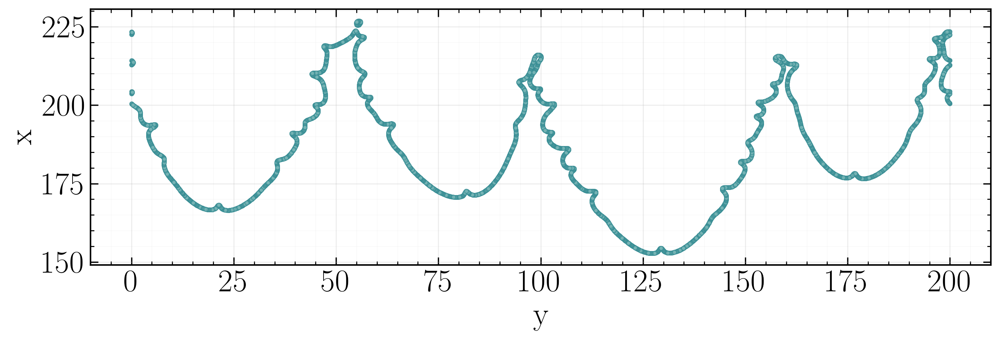

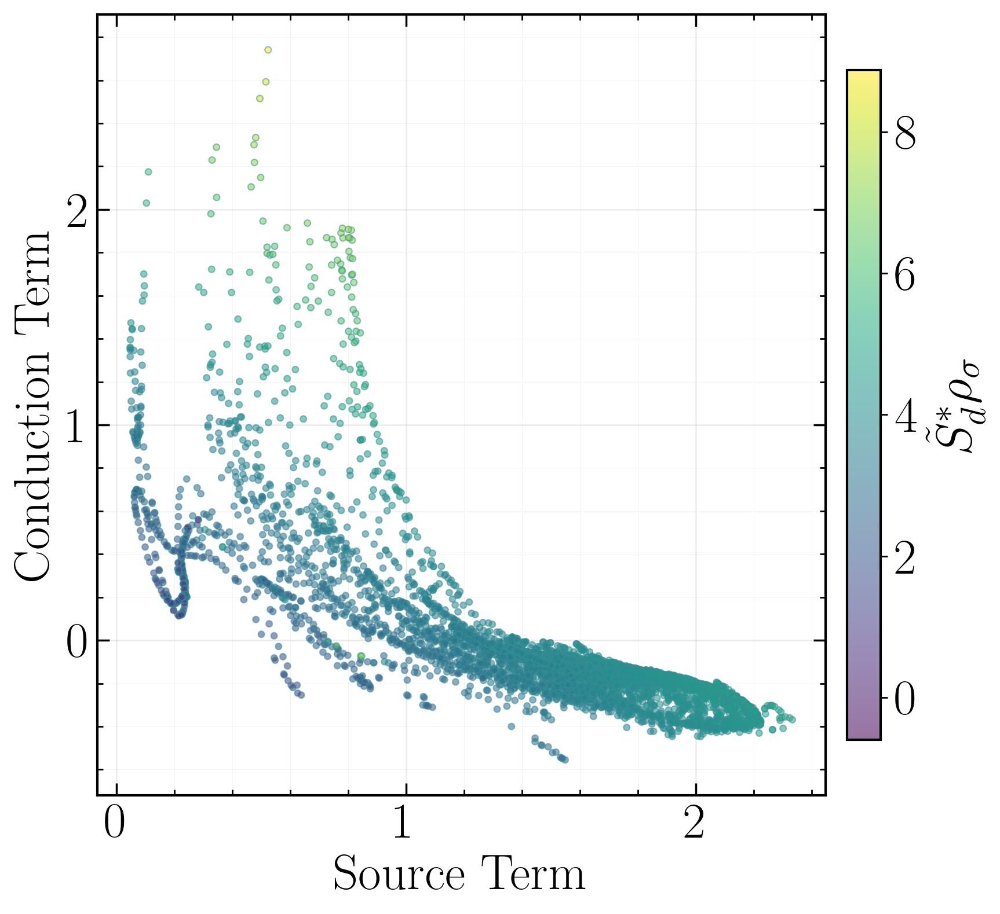

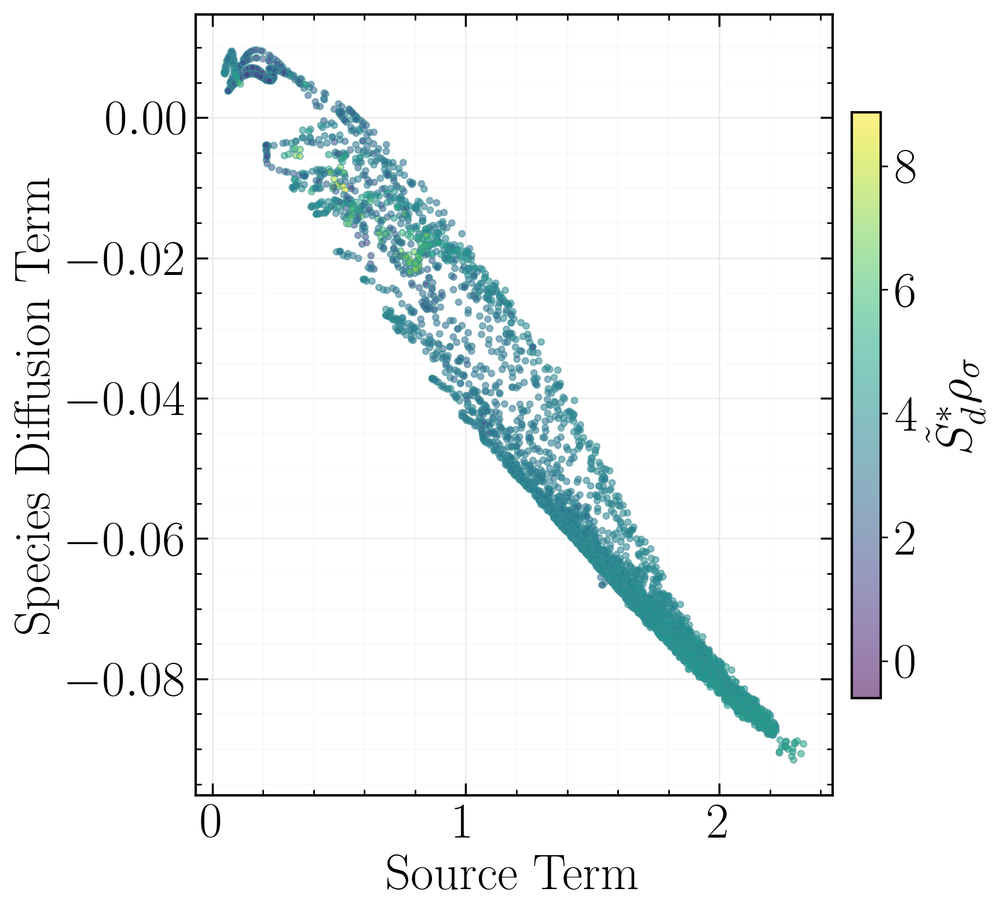

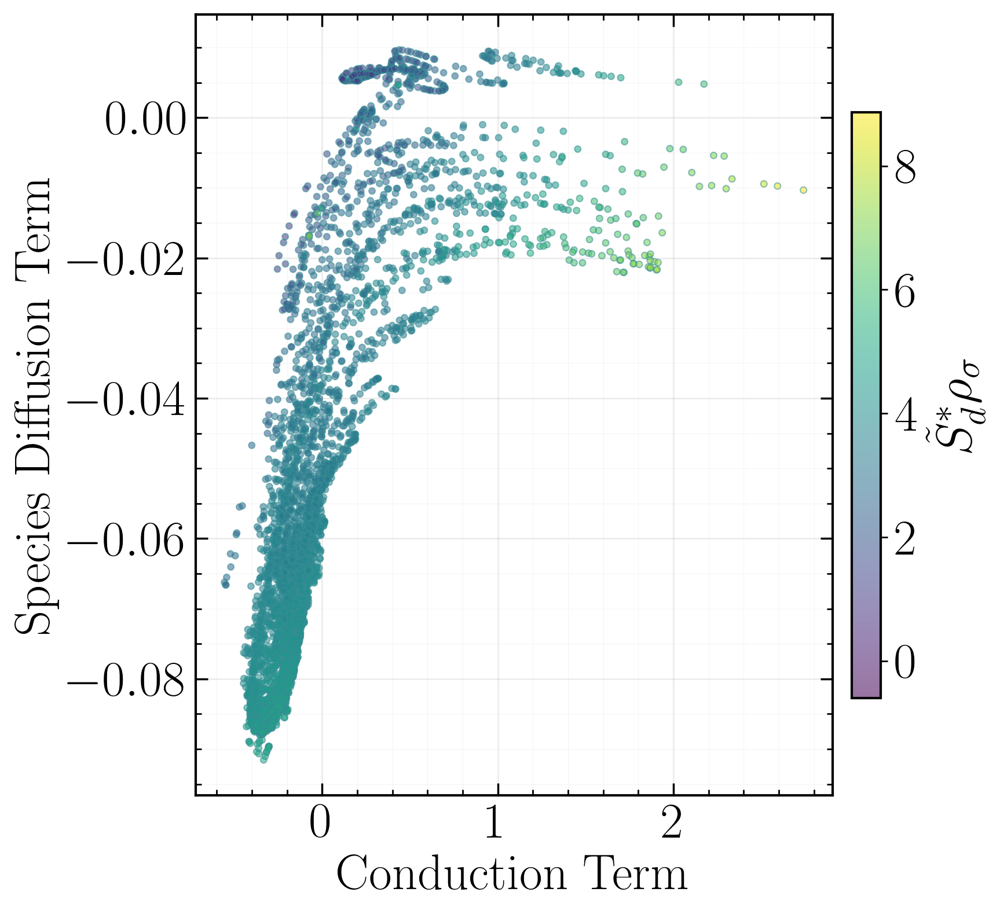

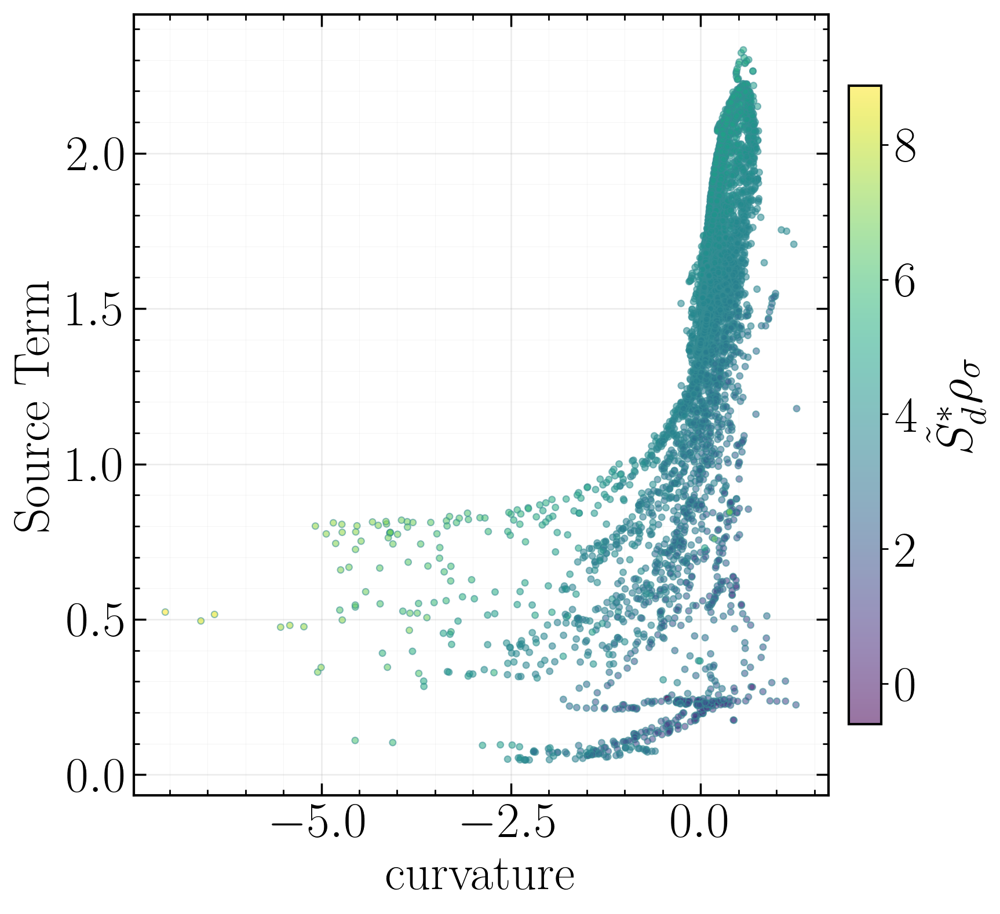

...

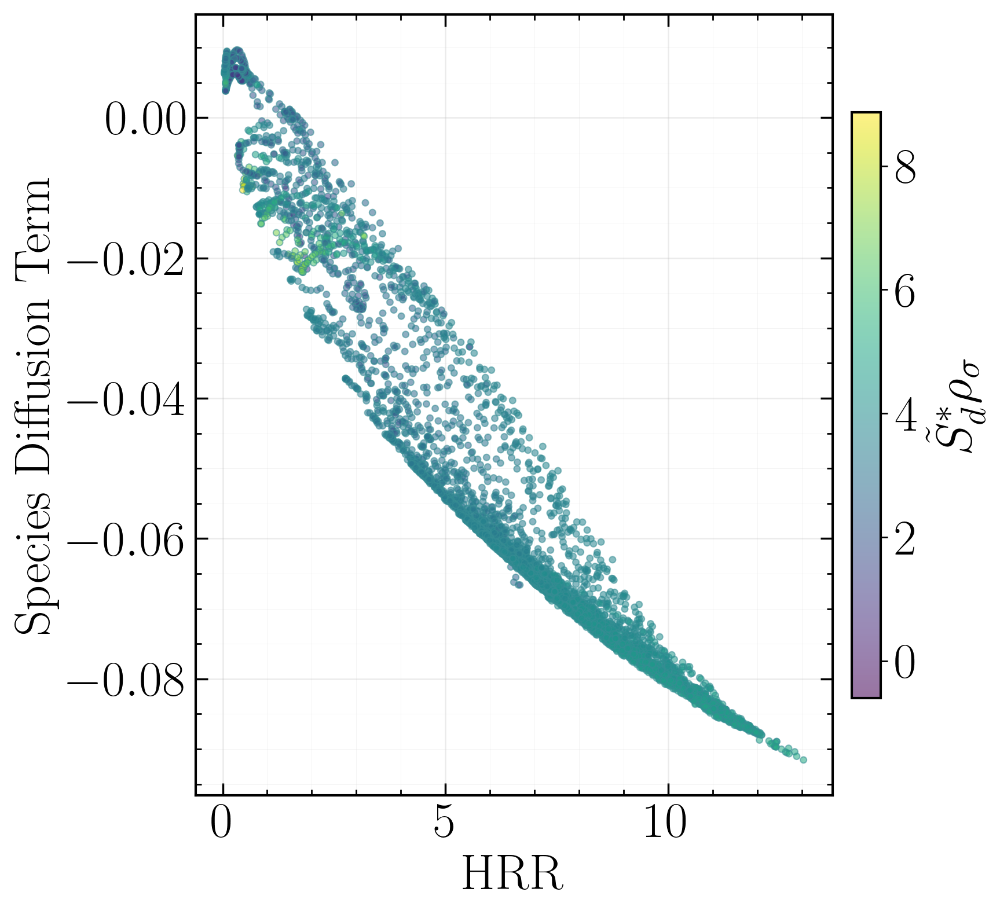

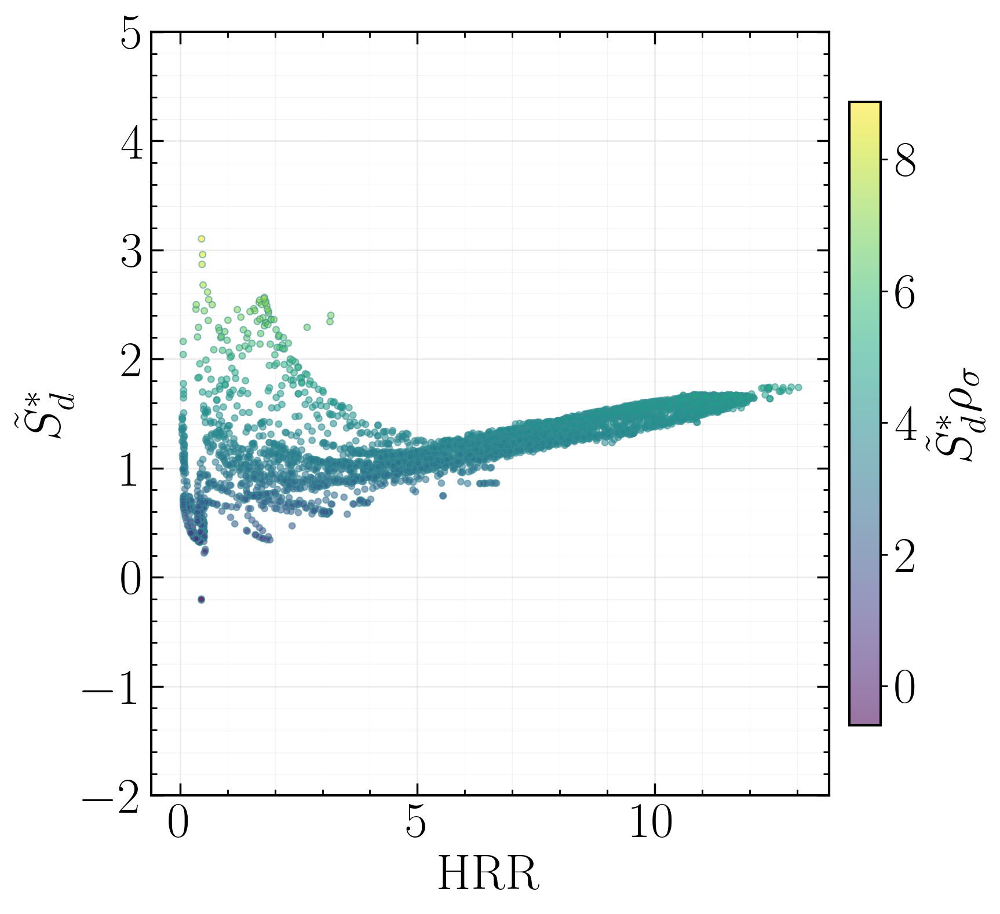

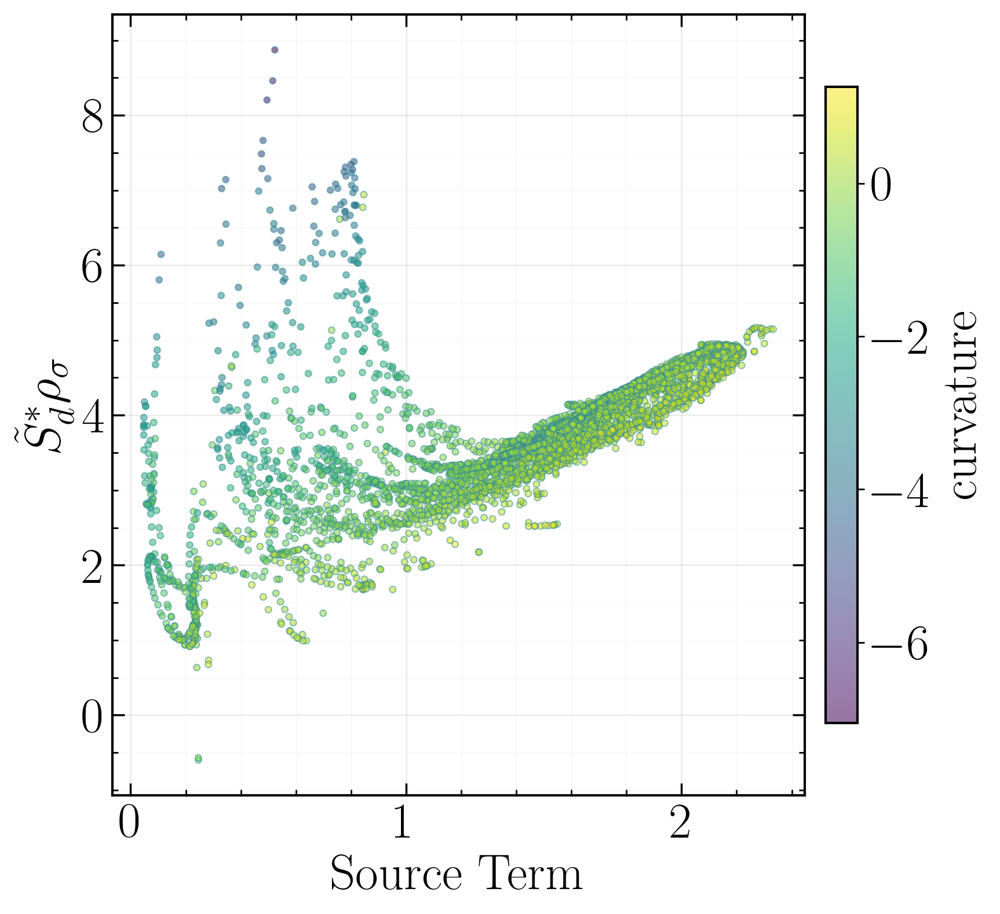

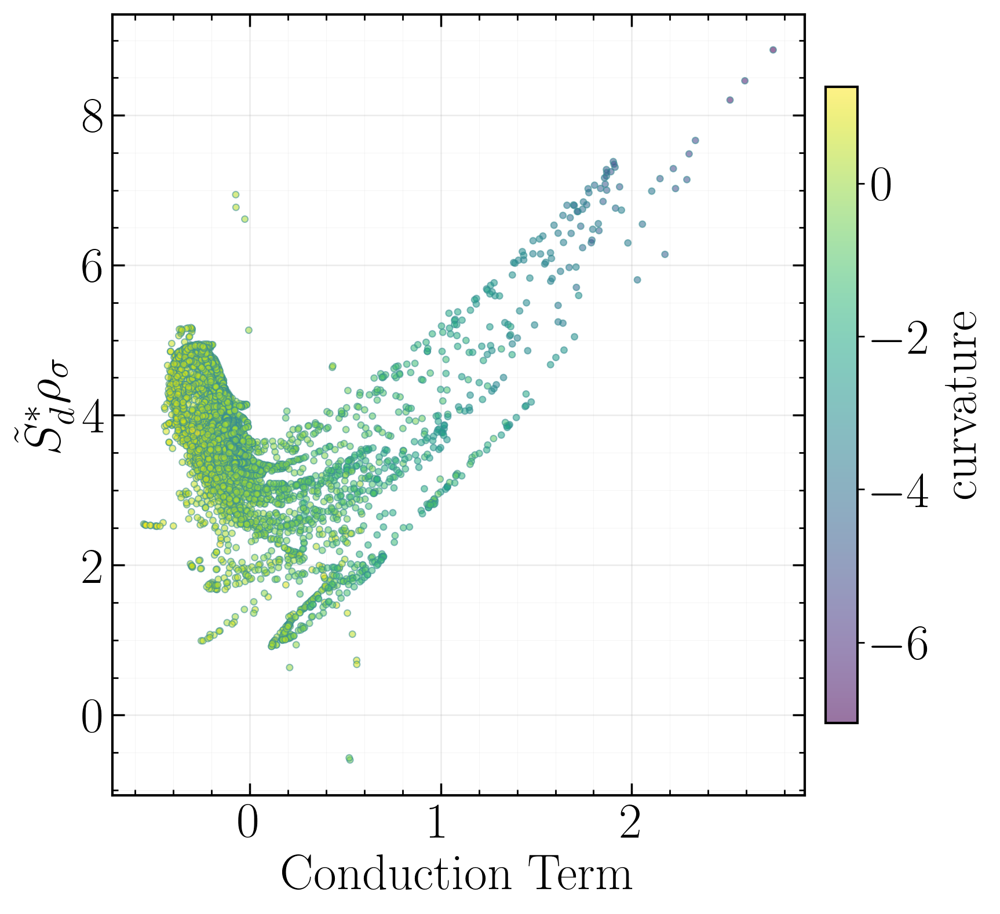

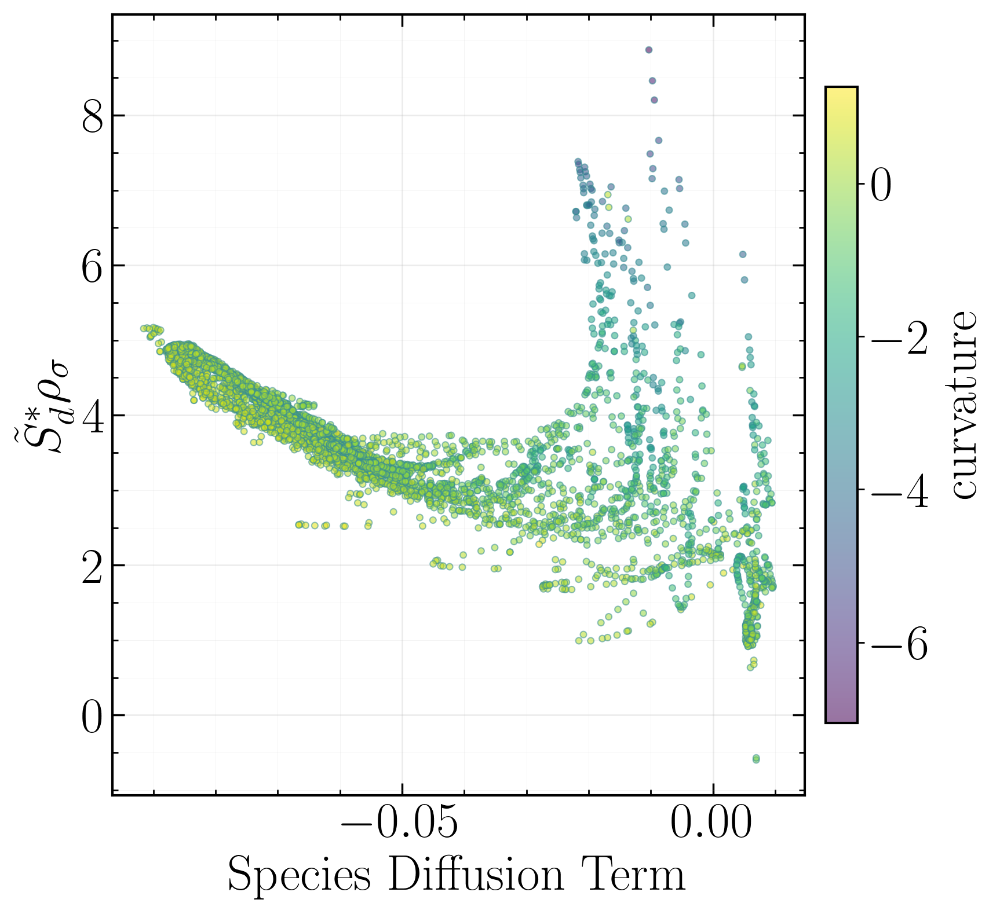

In [4]:
# Re-plot using density-weighted Sd scaled by density_ratio_sigma
SCALED_TARGET = f"{TARGET}_density_ratio_sigma"
DENSITY_RATIO_COL = "density_ratio_sigma"

HRR_COLUMN = "HRR"

LABEL_MAP[SCALED_TARGET] = r"$\tilde{S}_d^* \rho_{\sigma}$"

pairs = [
    (TERMS[0], TERMS[1]),
    (TERMS[0], TERMS[2]),
    (TERMS[1], TERMS[2]),
]

def plot_scaled_target_vs_feature(df: pd.DataFrame, target_col: str, feat: str, title: str,
                                  savepath: Path | None = None, color_by: str | None = None) -> None:
    fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=True)

    if color_by is None:
        ax.scatter(df[feat], df[target_col], s=SCATTER_S, alpha=ALPHA, color=COLOR_DATA,
                   edgecolors=COLOR_DATA_EDGE, linewidths=0.6, rasterized=RASTERIZE)
    else:
        sc = ax.scatter(df[feat], df[target_col], c=df[color_by], s=SCATTER_S, alpha=ALPHA,
                        edgecolors=COLOR_DATA_EDGE, linewidths=0.6, rasterized=RASTERIZE, cmap="viridis")
        cbar = fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.03)
        cbar.set_label(format_label(color_by))

    ax.set_xlabel(format_label(feat))
    ax.set_ylabel(format_label(target_col))
    style_axes(ax)
    apply_sd_axis_limits(ax, feat, target_col, SD_COLUMN, SD_MIN, SD_MAX)

    save_or_show(fig, savepath)

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        sd_cols = [SD_COLUMN] if sd_limits_active(SD_MIN, SD_MAX) else []
        require_columns(front, TERMS + [TARGET, DENSITY_RATIO_COL, HRR_COLUMN] + sd_cols, context=f"t={t}, ISO {c_val}:")

        out_dir = make_out_dir(t, float(c_val))
        if SAVE_FIGS:
            out_dir.mkdir(parents=True, exist_ok=True)

        # Valid rows for both cross-plots and DW-vs-feature plots
        cols_needed = TERMS + [TARGET, DENSITY_RATIO_COL, HRR_COLUMN, CURVATURE_COLUMN] + sd_cols
        dfv = clean_valid_rows(front, cols_needed)
        dfv = apply_sd_filter(dfv, SD_COLUMN, SD_MIN, SD_MAX)
        dfv[SCALED_TARGET] = dfv[TARGET] * dfv[DENSITY_RATIO_COL]

        if len(dfv) < MIN_SAMPLES:
            print(f"t={t}, T={float(c_val):.2f}: skipped (n={len(dfv)} < {MIN_SAMPLES})")
            continue

        # --------------------------
        # 0) Isocontour scatter (x vs y)
        # --------------------------
        require_columns(front, ["x", "y"], context=f"t={t}, ISO {c_val}:")
        df_iso = clean_valid_rows(front, ["x", "y"])
        plot_isocontour_scatter(df_iso, savepath=None)

        # --------------------------
        # 1) Pairwise cross-plots
        # --------------------------
        for f1, f2 in pairs:
            plot_cross_scatter(
                dfv,
                f1=f1,
                f2=f2,
                title=f"{f1} vs {f2} -- t={t}, T={float(c_val):.2f}",
                savepath=None,
                color_by=(SCALED_TARGET if COLOR_CROSS_BY_TARGET else None),
            )


        # --------------------------
        # 1b) Each term vs curvature
        # --------------------------
        for feat in TERMS:
            plot_cross_scatter(
                dfv,
                f1=CURVATURE_COLUMN,
                f2=feat,
                title=f"{CURVATURE_COLUMN} vs {feat} -- t={t}, T={float(c_val):.2f}",
                savepath=None,
                color_by=(SCALED_TARGET if COLOR_CROSS_BY_TARGET else None),
            )


        # --------------------------
        # 1c) HRR vs each term
        # --------------------------
        for feat in TERMS:
            plot_cross_scatter(
                dfv,
                f1=HRR_COLUMN,
                f2=feat,
                title=f"{HRR_COLUMN} vs {feat} -- t={t}, T={float(c_val):.2f}",
                savepath=None,
                color_by=(SCALED_TARGET if COLOR_CROSS_BY_TARGET else None),
            )

        # --------------------------
        # 1d) HRR vs target (e.g. gradT)
        # --------------------------
        hrr_target_savepath = None
        if SAVE_FIGS:
            hrr_target_fname = CROSS_FNAME_FMT.format(f1=HRR_COLUMN, f2=TARGET)
            hrr_target_savepath = out_dir / hrr_target_fname
        plot_cross_scatter(
            dfv,
            f1=HRR_COLUMN,
            f2=TARGET,
            title=f"{HRR_COLUMN} vs {TARGET} -- t={t}, T={float(c_val):.2f}",
            savepath=hrr_target_savepath,
            color_by=(SCALED_TARGET if COLOR_CROSS_BY_TARGET else None),
        )

        # --------------------------
        # 2) Scaled DW_FDS vs each term
        # --------------------------
        for feat in TERMS:
            plot_scaled_target_vs_feature(
                dfv,
                target_col=SCALED_TARGET,
                feat=feat,
                title=f"{SCALED_TARGET} vs {feat} -- t={t}, T={float(c_val):.2f}",
                savepath=None,
                color_by=CURVATURE_COLUMN,
            )


In [ ]:
# ============================================================
# Mass fraction vs reaction rate per species
# ============================================================
import math

if 'TIME_STEPS' not in globals():
    raise RuntimeError('Config not loaded. Run the setup cells first.')

fronts_all = []
for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)
    for _c_val, front in fronts_t.items():
        fronts_all.append(front)

if not fronts_all:
    raise RuntimeError('No fronts loaded. Check TIME_STEPS/PROGRESS_LEVELS.')

fronts_all = pd.concat(fronts_all, ignore_index=True)

omega_cols = [c for c in fronts_all.columns if c.startswith('omega_')]
pairs = []
for omega_col in omega_cols:
    species = omega_col.replace('omega_', '')
    mass_candidates = [
        species,
        f'Y_{species}',
        species.lower(),
        f'Y_{species.lower()}',
    ]
    mass_col = next((c for c in mass_candidates if c in fronts_all.columns), None)
    if mass_col is not None:
        pairs.append((species, mass_col, omega_col))

if not pairs:
    print('No (mass fraction, reaction rate) column pairs found. Checked omega_* with matching species columns.')
else:
    max_points = 50000
    ncols = 3
    nrows = math.ceil(len(pairs) / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.4 * ncols, 4.2 * nrows), dpi=FIG_DPI)
    if nrows * ncols == 1:
        axes = [axes]
    else:
        axes = axes.ravel()

    for ax, (species, mass_col, omega_col) in zip(axes, pairs):
        data = fronts_all[[mass_col, omega_col]].replace([np.inf, -np.inf], np.nan).dropna()
        if data.empty:
            ax.set_title(f'{species} (no finite data)')
            ax.set_axis_off()
            continue
        if len(data) > max_points:
            data = data.sample(max_points, random_state=0)
        ax.scatter(
            data[omega_col],
            data[mass_col],
            s=SCATTER_S,
            alpha=ALPHA,
            color=COLOR_DATA,
            edgecolors=COLOR_DATA_EDGE,
            linewidths=0.6,
            rasterized=RASTERIZE,
        )
        ax.set_xlabel(format_label(omega_col))
        ax.set_ylabel(format_label(mass_col))
        ax.set_title(species)
        style_axes(ax)

    for ax in axes[len(pairs):]:
        ax.set_axis_off()

    fig.suptitle('Mass fraction vs reaction rate per species', fontsize=PLOT_FONT_SIZE)
    fig.tight_layout(rect=[0, 0, 1, 0.96])

    savepath = None
    if SAVE_FIGS:
        savepath = REPORT_BASE_DIR / PHI_TAG / LAT_TAG / 'massfrac_vs_reaction_rate'
    save_or_show(fig, savepath)



Comparison for target = DW_FDS * density_ratio_sigma
Source+Conduction+Diffusion: R^2=-8.0098, RMSE=2.412581e+00
Source+Conduction-Diffusion: R^2=-7.1720, RMSE=2.297685e+00
Best (higher R^2): Source+Conduction -Diffusion


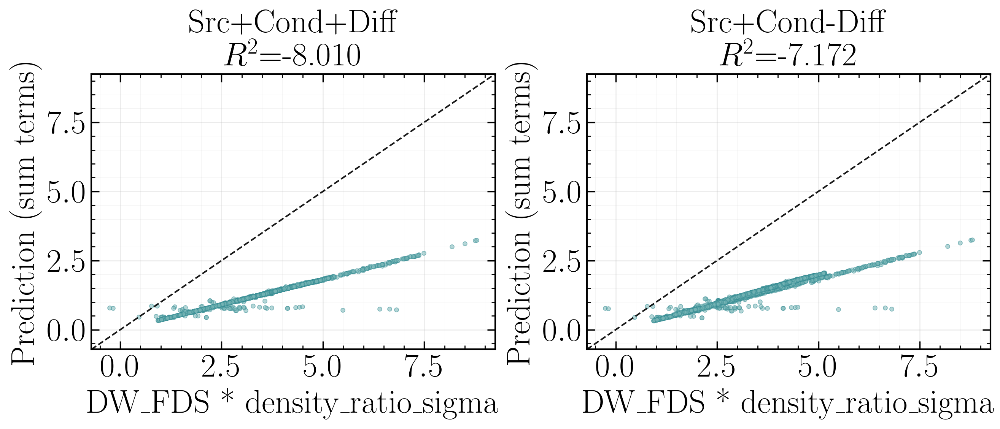

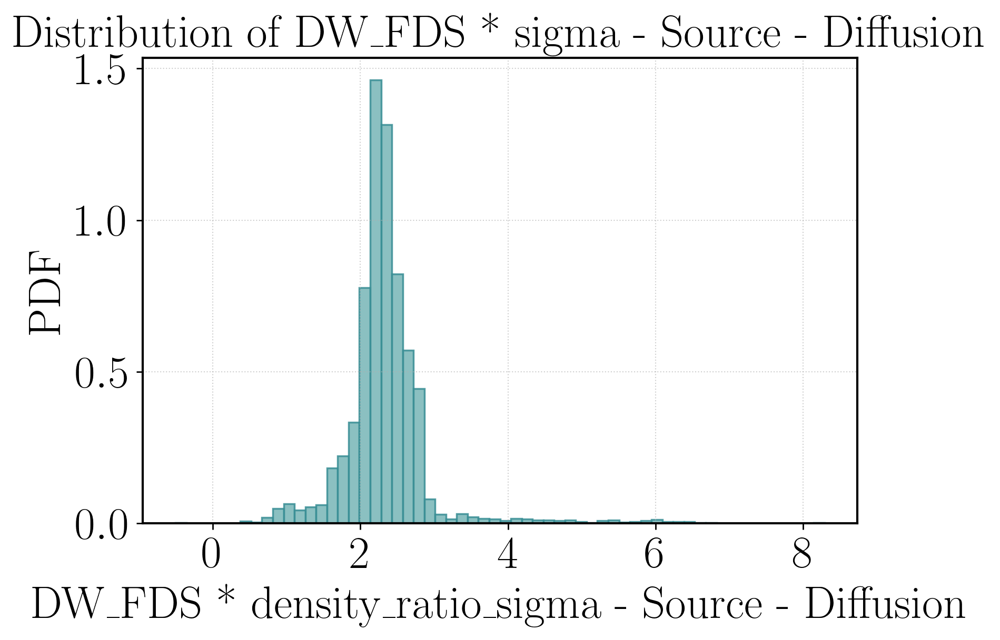

In [ ]:
# ============================================================
# Compare Source+Conduction±Diffusion vs DW_FDS*density_ratio_sigma
# ============================================================
from sklearn.metrics import r2_score, mean_squared_error

DENSITY_RATIO_COL = "density_ratio_sigma"
TARGET_COL = TARGET

if len(TERMS) < 3:
    raise RuntimeError("TERMS must contain source, conduction, diffusion in this order.")
SOURCE_COL = TERMS[0]
COND_COL = TERMS[1]
DIFF_COL = TERMS[2]

cols_needed = [SOURCE_COL, COND_COL, DIFF_COL, TARGET_COL, DENSITY_RATIO_COL]
rows = []
def add_one_to_one(ax, lw=1.2, ls="--", alpha=0.9):
    # Use current limits to define a shared range for the line
    x0, x1 = ax.get_xlim()
    y0, y1 = ax.get_ylim()
    lo = min(x0, y0)
    hi = max(x1, y1)
    ax.plot([lo, hi], [lo, hi], ls=ls, lw=lw, alpha=alpha, color="k", zorder=3)
    ax.set_xlim(lo, hi)
    ax.set_ylim(lo, hi)
for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)
    for c_val, front in fronts_t.items():
        require_columns(front, cols_needed, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, cols_needed)
        dfv = apply_sd_filter(dfv, SD_COLUMN, SD_MIN, SD_MAX)
        if dfv.empty:
            continue
        target = dfv[TARGET_COL] * dfv[DENSITY_RATIO_COL]
        combo_plus = dfv[SOURCE_COL] + dfv[COND_COL] + dfv[DIFF_COL]
        combo_minus = dfv[SOURCE_COL] + dfv[COND_COL] - dfv[DIFF_COL]
        rows.append(pd.DataFrame({
            "target": target,
            "combo_plus": combo_plus,
            "combo_minus": combo_minus,
            "source": dfv[SOURCE_COL],
            "diffusion": dfv[DIFF_COL],
        }))

if not rows:
    raise RuntimeError("No valid rows found for comparison.")

df_all = pd.concat(rows, ignore_index=True)

def score_pred(y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    rmse = float(np.sqrt(mean_squared_error(y_true, y_pred)))
    return r2, rmse

r2_plus, rmse_plus = score_pred(df_all["target"], df_all["combo_plus"])
r2_minus, rmse_minus = score_pred(df_all["target"], df_all["combo_minus"])

print("")
print("Comparison for target = DW_FDS * density_ratio_sigma")
print(f"Source+Conduction+Diffusion: R^2={r2_plus:.4f}, RMSE={rmse_plus:.6e}")
print(f"Source+Conduction-Diffusion: R^2={r2_minus:.4f}, RMSE={rmse_minus:.6e}")
best_label = "+Diffusion" if r2_plus >= r2_minus else "-Diffusion"
print(f"Best (higher R^2): Source+Conduction {best_label}")

fig, axes = plt.subplots(1, 2, figsize=(10.4, 4.4), dpi=FIG_DPI, constrained_layout=True)
axes = np.atleast_1d(axes)

axes[0].scatter(df_all["target"], df_all["combo_plus"], s=SCATTER_S, alpha=ALPHA, color=COLOR_DATA, edgecolors=COLOR_DATA_EDGE, linewidths=0.5, rasterized=RASTERIZE)
axes[0].set_title(f"Src+Cond+Diff\n$R^2$={r2_plus:.3f}")
axes[0].set_xlabel("DW_FDS * density_ratio_sigma")
axes[0].set_ylabel("Prediction (sum terms)")
add_one_to_one(axes[0])
style_axes(axes[0])

axes[1].scatter(df_all["target"], df_all["combo_minus"], s=SCATTER_S, alpha=ALPHA, color=COLOR_DATA, edgecolors=COLOR_DATA_EDGE, linewidths=0.5, rasterized=RASTERIZE)
axes[1].set_title(f"Src+Cond-Diff\n$R^2$={r2_minus:.3f}")
axes[1].set_xlabel("DW_FDS * density_ratio_sigma")
axes[1].set_ylabel("Prediction (sum terms)")
add_one_to_one(axes[1])
style_axes(axes[1])

plt.show()

# -----------------------------
# Distribution of DW_FDS * sigma - Source - Diffusion
# -----------------------------
residual = df_all["target"] - df_all["source"] - df_all["diffusion"]

fig, ax = plt.subplots(figsize=(7.0, 4.6), dpi=FIG_DPI)
ax.hist(residual, bins=60, density=True, color=COLOR_DATA, edgecolor=COLOR_DATA_EDGE, alpha=0.85)
ax.set_xlabel("DW_FDS * density_ratio_sigma - Source - Diffusion")
ax.set_ylabel("PDF")
ax.set_title("Distribution of DW_FDS * sigma - Source - Diffusion")
ax.grid(True, linestyle=":", linewidth=0.6, alpha=0.6)
plt.show()
